# Рынок заведений общественного питания Москвы

### Описание данных  
Файл moscow_places.csv:  
* name — название заведения;  
* address — адрес заведения;  
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
* hours — информация о днях и часах работы;  
* lat — широта географической точки, в которой находится заведение;  
* lng — долгота географической точки, в которой находится заведение;  
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
«Средний счёт: 1000–1500 ₽»;  
«Цена чашки капучино: 130–220 ₽»;  
«Цена бокала пива: 400–600 ₽».  
и так далее;  
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
0 — заведение не является сетевым  
1 — заведение является сетевым  
* district — административный район, в котором находится заведение, например Центральный административный округ;  
* seats — количество посадочных мест.  

In [1]:
# загружаем библиотеки
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
from plotly import graph_objects as go
from scipy import stats as st 
import seaborn as sns
import plotly.express as px
import json
import folium
from folium import Map, Choropleth
from folium import Marker, Map
from folium.features import CustomIcon
from folium.plugins import MarkerCluster

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод**  
Данные загружены и готовы к исследованию, всего 8406 записей в датафрейме, видно, что в столбцах присутствуют пропуски, тип данных соответствует для каждого столбца.

### Предобработка

In [5]:
# посмотрим пропуски в столбцах
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропусков в данных огромное количество, их мы трогать пока не будем

In [6]:
# просчитаем количество дубликатов
df.duplicated().sum()

0

In [7]:
# приведем названия к нижнему регистру
df['name'] = df['name'].str.lower()

In [8]:
# проверим количество дубликатов по названию и адресу
display(df.loc[df.duplicated(subset=['name', 'address'], keep=False)])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [9]:
# удалим дубликаты, оставим только одну строку для каждого заведения
df=df.drop_duplicates(subset=['name', 'address'], keep='first')

In [10]:
# проверяем количество дубликатов после обработки
display(df.loc[df.duplicated(subset=['name', 'address'], keep=False)])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [11]:
# посмотрим уникальные названия заведений
list(df['name'].unique())

['wowфли',
 'четыре комнаты',
 'хазри',
 'dormouse coffee shop',
 'иль марко',
 'sergio pizza',
 'огни города',
 'mr. уголёк',
 'donna maria',
 'готика',
 'great room bar',
 'шашлык шефф',
 'заправка',
 'буханка',
 'у сильвы',
 'дом обеда',
 'база стритфуд',
 'чайхана беш-бармак',
 'час-пик',
 'пекарня',
 'чебуреки манты',
 '7/12',
 'крымские чебуреки',
 'drive café',
 'в парке вкуснее',
 'пикочино',
 'шаурму х@чу',
 'mafe',
 'кушай город',
 'кафедра',
 'алталия',
 'додо пицца',
 'изба',
 "домино'с пицца",
 'виладж пицца',
 'пекарня № 1 грузинская кухня',
 'халяль закусочная',
 'ижора',
 'шаурмагия',
 'кафе',
 'крошка картошка',
 'варня кафе',
 'суши & пицца',
 'кафетерий',
 '9 bar coffee',
 'cofefest',
 'блинбери',
 '2u-ту-ю',
 'шаурма',
 'арамье',
 'cofix',
 'royal coffee',
 'шашлык',
 'чебуреки и манты',
 'рыба из тандыра',
 'мир пиццы',
 "coffeekaldi's",
 'хинкали gали!',
 'чебуречная история',
 'кафе лоза',
 'пить есть!',
 'pizza hut',
 'testo мания',
 'альбатрос',
 'молинари',
 '

In [12]:
# заметила, что среди заведений есть сеть почтоматов, проверим
df.query('name == "халва, сеть почтоматов"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1067,"халва, сеть почтоматов",кафе,"Москва, улица Лётчика Бабушкина, 21/2",Северо-Восточный административный округ,NaN,55.865923,37.674490,4.1,NaN,NaN,NaN,NaN,1,NaN
2571,"халва, сеть почтоматов",кафе,"Москва, проспект Мира, 146",Северо-Восточный административный округ,пн-пт 10:00–19:00,55.820575,37.641970,3.6,NaN,NaN,NaN,NaN,0,18.0
2990,"халва, сеть почтоматов",кафе,"Москва, Семёновская площадь, 7",Восточный административный округ,пн-пт 09:00–20:00; сб 09:00–17:00,55.783530,37.720028,4.8,NaN,NaN,NaN,NaN,1,NaN
6395,"халва, сеть почтоматов",кафе,"Москва, улица Фёдора Полетаева, 15, корп. 4, с...",Юго-Восточный административный округ,NaN,55.710476,37.784227,3.7,NaN,NaN,NaN,NaN,1,NaN


In [13]:
# удалим эти строки
df = df.drop(df[df['name'] == 'халва, сеть почтоматов'].index)

In [14]:
# заменим пропуски в столбце hours на неизвестно
df['hours'] = df['hours'].fillna('Unknown')

#### Создайте столбец street с названиями улиц из столбца с адресом.

In [15]:
df['street'] = df['address'].str.split(",", expand=True)[1]
display(df.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [16]:
# удалим пробелы в начале и конце строк в столбце street
df['street'] = df['street'].str.strip()
display(df.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


#### Создайте столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;  
логическое значение False — в противоположном случае.

In [17]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [18]:
df.head(50)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


**Вывод**  
Данные предобработаны, добавлен столбец с названием улицы и столбец с обозначением круглосуточных заведений, удалены дубликаты, заменены пропуски в столбце hours.

### Анализ данных

#### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.


In [19]:
# создадим сводную таблицу по категориям
# посмотрим, сколько заведений есть в каждой категории
categories = df.pivot_table(index='category',values='name',aggfunc='count').sort_values(by='name', ascending=False).reset_index()

total = categories['name'].sum()
# посчитаем долю
categories['percent'] = round((categories['name'] / total * 100), 2)

In [20]:
categories

,category,name,percent
0,кафе,2373,28.25
1,ресторан,2042,24.31
2,кофейня,1413,16.82
3,"бар,паб",764,9.10
4,пиццерия,633,7.54
5,быстрое питание,603,7.18
6,столовая,315,3.75
7,булочная,256,3.05


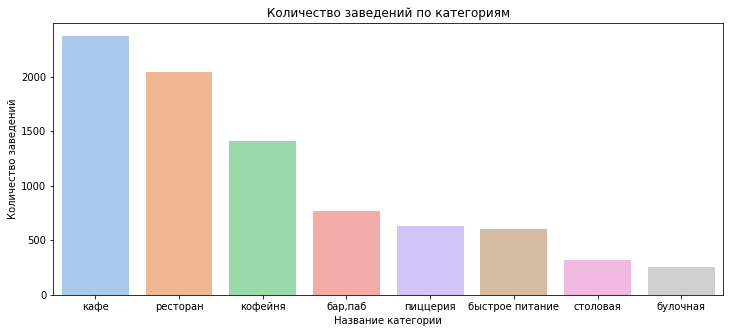

In [21]:
plt.figure(figsize=(12, 5))
ax = sns.barplot(x='category', y='name', data=categories, palette='pastel')
plt.title('Количество заведений по категориям')
plt.xlabel('Название категории')
plt.ylabel('Количество заведений')
plt.show()

In [22]:
# построим круговую диаграмму, чтобы посмотреть долю каждой категории
fig = go.Figure(data=[go.Pie(labels=categories['category'], values=categories['name'])])
fig.update_layout(title='Количество заведений по категориям', margin=dict(l=0, r=0, t=80, b=0), width=700, height=600)
fig.show()

**Вывод**  
Топ 3 категории: кафе - 28.3%, ресторан - 24.3%, кофейня - 16.8%.  
Меньше всего заведений быстрого питания - 7.18%, столовая - 3.75%, булочная - 3.05%.

#### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.


In [23]:
# посмотрим среднее и максимальное количество посадочных мест
df['seats'].describe()

count    4791.000000
mean      108.380296
std       122.847013
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

In [24]:
# посмотрим заведения, в которых количество посадочных мест превышает 500
df.query('seats > 500')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1326,нам,"бар,паб","Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 11:00–21:00",55.803236,37.517898,4.2,NaN,NaN,NaN,NaN,1,625.0,Ленинградский проспект,False
1351,максима пицца,пиццерия,"Москва, Ленинградский проспект, 78, корп. 1",Северный административный округ,"пн-пт 09:00–00:00; сб,вс 10:00–00:00",55.805807,37.513994,4.3,выше среднего,Средний счёт:1500–1800 ₽,1650.0,NaN,0,625.0,Ленинградский проспект,False
1355,страдивари,ресторан,"Москва, Ленинградский проспект, 77, корп. 1",Северный административный округ,"ежедневно, 11:00–23:00",55.804980,37.509454,4.2,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,1,625.0,Ленинградский проспект,False
1367,академия,пиццерия,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 09:00–23:00; сб,вс 11:00–23:00",55.805579,37.520086,4.2,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,1,625.0,Ленинградский проспект,False
1380,север-метрополь,кофейня,"Москва, Ленинградский проспект, 75, корп. 1",Северный административный округ,"ежедневно, 09:00–21:00",55.804940,37.512423,4.6,NaN,NaN,NaN,NaN,1,625.0,Ленинградский проспект,False
1385,чайхона на соколе,кафе,"Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.803236,37.517931,4.3,средние,Средний счёт:400–800 ₽,600.0,NaN,0,625.0,Ленинградский проспект,False
1393,кулинарная лавка братьев караваевых,кафе,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.805791,37.520339,4.3,NaN,Средний счёт:500–800 ₽,650.0,NaN,1,625.0,Ленинградский проспект,False
1442,abc coffee roasters,кофейня,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.805547,37.520395,4.5,средние,Цена чашки капучино:220–270 ₽,NaN,245.0,0,625.0,Ленинградский проспект,False
1446,9 bar coffee,кофейня,"Москва, Ленинградский проспект, 80, корп. 1",Северный административный округ,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.810352,37.506625,4.3,NaN,Цена чашки капучино:60–150 ₽,NaN,105.0,1,625.0,Ленинградский проспект,False
1464,находка,ресторан,"Москва, Ленинградский проспект, 74, корп. 1",Северный административный округ,"ежедневно, 09:00–22:00",55.804972,37.517319,4.9,NaN,NaN,NaN,NaN,1,625.0,Ленинградский проспект,False


In [25]:
# отсортируем категории по медиане количества посадочных мест
median_order = df.groupby('category')['seats'].median().sort_values(ascending=False).index
# создаем новую таблицу с отсортированными категориями
df_sorted = df.set_index('category').loc[median_order].reset_index()

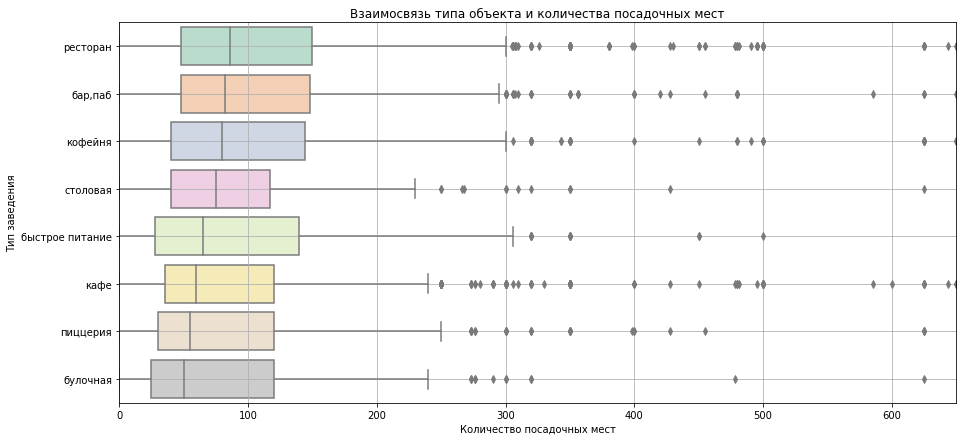

In [26]:
plt.figure(figsize=(15, 7))
sns.boxplot(x='seats', y='category', data=df_sorted, palette='Pastel2')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Тип заведения')
plt.xlim(0, 650)
plt.grid()
plt.title('Взаимосвязь типа объекта и количества посадочных мест')
plt.show()

В данных есть заведения, в которых нет посадочных мест и заведения, где посадочных мест больше 500. Для дальнейшего исследования возьмем медианное значение посадочных мест.

In [27]:
# создадим новый датафрейм с категориями и медианным значением посадочных мест
seats2 = df.groupby('category')['seats'].median().sort_values(ascending=False).reset_index()
seats2.columns = ['category', 'seats_median']

In [28]:
seats2

,category,seats_median
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


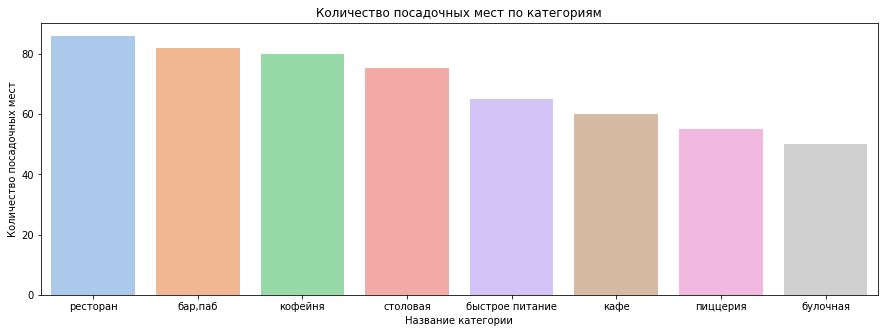

In [29]:
plt.figure(figsize=(15, 5))
ax = sns.barplot(x='category', y='seats_median', data=seats2, palette='pastel')
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Название категории')
plt.ylabel('Количество посадочных мест')
plt.show()

**Вывод**  
Больше всего посадочных мест в ресторанах, барах, кофейнях и столовых.
Меньше всего посадочных мест в булочной, скорее всего это обусловлено тем, что многие булочные работают на вынос. 

#### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?



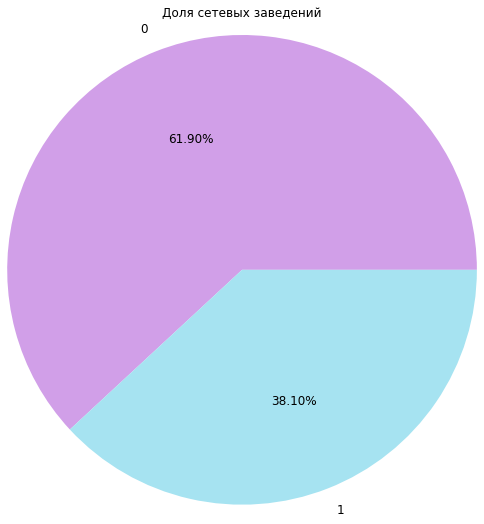

In [30]:
# построим круговую диаграмму, чтобы посмотреть соотношение сетевых и несетевых заведений
plt.figure(figsize=(7, 6))
df['chain'].value_counts().plot.pie(radius=1.8, autopct='%1.2f%%', fontsize=12, colors=['#D19FE8','#a6e3f1'])
plt.title('Доля сетевых заведений', pad=90)
plt.ylabel(None)
plt.show()

**Вывод**  
На графике 1 - это сетевое заведение, 0 - несетевое заведение. Не сетевых заведений больше, чем сетевых.

#### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.


In [31]:
chain_df = df.groupby('category').agg({'chain' : 'count'}).rename(columns={'chain': 'sum_chain'}).reset_index()

# посчитаем количество сетевых и несетевых 
chain_0 = df[df.chain == 0].groupby('category').agg({'chain' : 'count'}).reset_index()
chain_1 = df[df.chain == 1].groupby('category').agg({'chain' : 'count'}).reset_index()

In [32]:
chain_df

,category,sum_chain
0,"бар,паб",764
1,булочная,256
2,быстрое питание,603
3,кафе,2373
4,кофейня,1413
5,пиццерия,633
6,ресторан,2042
7,столовая,315


In [33]:
# рассчитаем долю ссетевых и не сетевых заведений по категориям
# стоблец sum_chain с общим количеством удалим
chain_df['not_chain, %'] = round(chain_0['chain']/chain_df['sum_chain']*100,2)
chain_df['chain, %'] = round(chain_1['chain']/chain_df['sum_chain']*100,2)
chain_df = chain_df.drop(columns=['sum_chain']).sort_values(by='not_chain, %', ascending=False)

In [34]:
chain_df

,category,"not_chain, %","chain, %"
0,"бар,паб",78.01,21.99
7,столовая,72.06,27.94
3,кафе,67.30,32.70
6,ресторан,64.30,35.70
2,быстрое питание,61.53,38.47
4,кофейня,49.04,50.96
5,пиццерия,47.87,52.13
1,булочная,38.67,61.33


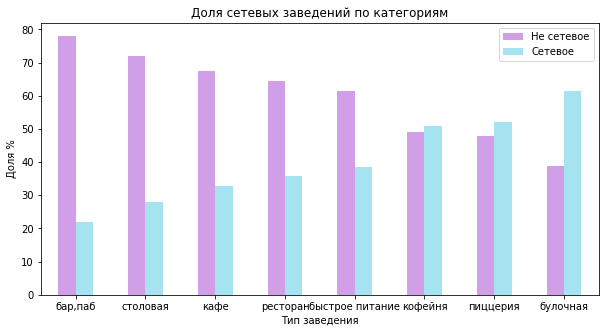

In [35]:
chain_df.plot.bar(x='category', figsize=(10,5), color=['#D19FE8','#a6e3f1'])
plt.xlabel('Тип заведения')
plt.ylabel('Доля %')
plt.title('Доля сетевых заведений по категориям')
plt.legend(["Не сетевое", "Сетевое"], loc='upper right')
plt.xticks(rotation=0)
plt.show()

**Вывод**  
Чаще всего не сетевыми заведениями являются бары, столовые, кафе и рестораны.  
Топ 3 сетевых заведений это булочные, пиццерии и кофейни.

#### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?


In [36]:
top15 = df[df['chain'] == 1]['name'].value_counts()[:15].sort_values(ascending=False).to_frame().reset_index()
top15.columns = ['name', 'count']

In [37]:
top15

,name,count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


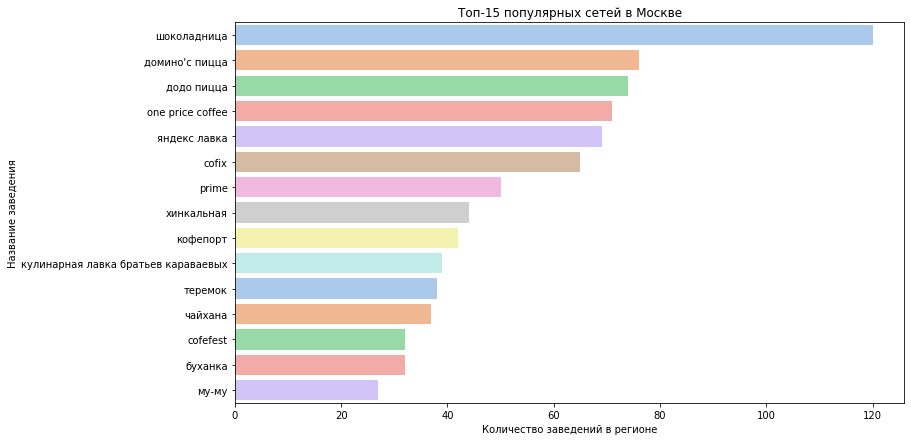

In [38]:
plt.figure(figsize=(12, 7))
ax = sns.barplot(x='count', y='name', data=top15, palette='pastel')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений в регионе')
plt.ylabel('Название заведения')
plt.show()

В Москве любят кофе, пиццу и быстрое обслуживание, посмотрим, эти заведения по категориям.

In [39]:
# создадим фильтр по списку заведений
list_top_15 = list(top15['name'])
data_filter_top_15 = df[df.name.isin(list_top_15)]
top = data_filter_top_15['category'].value_counts().to_frame().reset_index()
top.columns = ['category', 'count']

In [40]:
top

,category,count
0,кофейня,337
1,ресторан,186
2,пиццерия,152
3,кафе,100
4,булочная,25
5,быстрое питание,12
6,"бар,паб",4
7,столовая,2


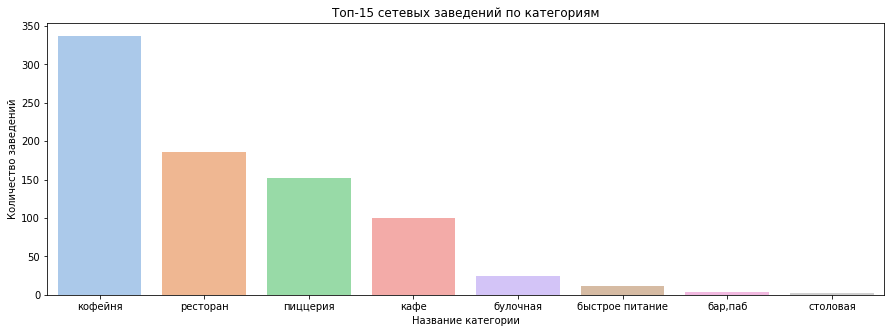

In [41]:
plt.figure(figsize=(15, 5))
ax = sns.barplot(x='category', y='count', data=top, palette='pastel')
plt.title('Топ-15 сетевых заведений по категориям')
plt.xlabel('Название категории')
plt.ylabel('Количество заведений')
plt.show()

**Вывод**  
Заведения объединяет не только то, что они являются сетевыми, но и их ценовая политика. Все они предлагают средние и низкие цены, что делает их доступными для широкого круга потребителей.  
Хотя некоторые сети входят в топ-15, не все категории, к которым они принадлежат, занимают лидирующие позиции по количеству заведений в целом. Например, Буханка входит в топ-15 заведений по Москве, но категория булочных в целом находится в конце списка. Лидирующие позиции занимают кофейни, рестораны и пиццерии.  

#### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.


In [42]:
# сгруппируем количество категорий
group_district = df.groupby(['district', 'category']).agg({'name':'count'}).reset_index()
group_district.columns = ['district', 'category', 'count']

In [43]:
# посчитаем количество заведений
group_district_sum = group_district.groupby('district')['count'].transform('sum').to_frame()
group_district_sum.columns = ['total_count']

In [44]:
# объединим таблицы
group_district_final = group_district.join(group_district_sum).sort_values(by='total_count', ascending=False)

In [45]:
# добавим новый столбец, который содержит долю каждой категории в общем количестве заведений в районе
group_district_final['percent'] = round((group_district_final['count'] / group_district_final['total_count']*100),2)

In [46]:
group_district_final

,district,category,count,total_count,percent
41,Центральный административный округ,булочная,50,2242,2.23
42,Центральный административный округ,быстрое питание,87,2242,3.88
43,Центральный административный округ,кафе,464,2242,20.70
44,Центральный административный округ,кофейня,428,2242,19.09
45,Центральный административный округ,пиццерия,113,2242,5.04
...,...,...,...,...,...
33,Северо-Западный административный округ,булочная,12,409,2.93
34,Северо-Западный административный округ,быстрое питание,30,409,7.33
35,Северо-Западный административный округ,кафе,115,409,28.12
37,Северо-Западный административный округ,пиццерия,40,409,9.78


In [47]:
# построим график, который отобразит количество заведений и количество заведений каждой категории по районам
fig = px.bar(group_district_final, x = 'count', y = 'district', color = 'category', title = 'Общее количество заведений и количество заведений каждой категории по районам', 
             barmode = 'stack', height = 800)
fig.update_xaxes(title_text='Кол-во заведений')
fig.update_yaxes(title_text='Район')
fig.show()

**Вывод**  
Больше всего заведений располагается в Центральном административном округе - 2242шт, из этих заведений больше всего ресторанов, на втором и третьем месте кафе и кофейни. Меньше всего заведений в Северо-западном административном округе, там всего 409 заведений. Булочные, столовые и рестораны быстрого питания не пользуются популярностью ни в одном районе.

#### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [48]:
rating = df.groupby('category').agg({'rating': 'mean'}).round(2).sort_values(by='rating', ascending=False).reset_index()

In [49]:
rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [50]:
fig = px.bar(rating, x = 'category', y = 'rating', labels = {'rating': 'Средний рейтинг', 'category': 'Категория заведения'},
                title = 'Распределение средних рейтингов по категориям заведений', text='rating', color_discrete_sequence=['#dda6ff'])
fig.show()

**Вывод**  
Самый высокий средний рейтинг у баров - 4.39, скорее всего такой высокий рейтинг обусловлен увесилительной атмосферой, а также к барам и пабам у посетителей меньше ожиданий, чем, например, к ресторанам и пиццериям.  
Самый низкий у ресторанов быстрого питания - 4.05, возможно, это обусловено неудобным расположением и низким качеством. 

#### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).


In [51]:
# сгруппируем данные и посчитаем средний рейтинг по районам
rating_data = round(df.groupby('district')['rating'].mean(),2)

In [52]:
rating_data.sort_values(ascending = False)

district
Центральный административный округ         4.38
Северный административный округ            4.24
Северо-Западный административный округ     4.21
Западный административный округ            4.18
Южный административный округ               4.18
Восточный административный округ           4.17
Юго-Западный административный округ        4.17
Северо-Восточный административный округ    4.15
Юго-Восточный административный округ       4.10
Name: rating, dtype: float64

In [53]:
# загружаем JSON-файл с границами округов Москвы
moscow_area = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы
# moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10.5)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(geo_data=moscow_area, data=rating_data, columns=['district', 'rating'], key_on='feature.name', fill_color='PuRd',
    fill_opacity=0.8, legend_name='Средний рейтинг заведений по районам').add_to(moscow_map)

moscow_map

**Вывод**  
В центральном районе рейтинг заведений самый высокий, это в том числе обусловлено тем, что в центре больше всего заведений, это мы уже исследовали ранее.

#### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.


In [54]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(moscow_map)
# пишем функцию, которая создаёт маркер в текущей точке и добавляет его в кластер
def create_clusters(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}").add_to(marker_cluster)
# применяем функцию к каждой строке датафрейма
df.apply(create_clusters, axis=1)
moscow_map

#### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.


In [55]:
# найдем топ 15 улиц по количеству заведений
street15 = df.groupby(['street']).agg({'name':'count'}).sort_values(by='name', ascending=False)[:15].reset_index()
street15.columns = ['street', 'count']

In [56]:
street15

,street,count
0,проспект Мира,182
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [57]:
# разобьем по категориям
street_category = df.groupby(['street', 'category']).agg({'name': 'count'}).rename(columns={'name': 'category_count'}).reset_index()
street_category.columns = ['street','category', 'count']
street_category = street_category.sort_values(by='count', ascending=False)

In [58]:
street_category

,street,category,count
2860,проспект Мира,кафе,52
1380,МКАД,кафе,45
2863,проспект Мира,ресторан,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1531,Моховая улица,"бар,паб",1
1533,Мукомольный проезд,булочная,1
1534,Мукомольный проезд,быстрое питание,1
1535,Мукомольный проезд,пиццерия,1


In [59]:
street_data = street15.merge(street_category, on='street', how='left').sort_values(by='category', ascending=False)
street_data = street_data.sort_values(by='count_y', ascending=False)

In [60]:
street_data

,street,count_x,category,count_y
0,проспект Мира,182,кафе,52
70,МКАД,65,кафе,45
1,проспект Мира,182,ресторан,45
2,проспект Мира,182,кофейня,36
8,Профсоюзная улица,122,кафе,35
...,...,...,...,...
74,МКАД,65,"бар,паб",1
97,Кутузовский проспект,54,булочная,1
23,проспект Вернадского,108,булочная,1
82,Люблинская улица,60,пиццерия,1


In [61]:
fig = px.bar(street_data, x='count_y', y='street', color='category', 
             title='Распределение количества заведений и их категорий по топ-15 улицам', 
             barmode='stack', height=800, labels={'count_y': 'Количество заведений', 'street': 'Улица'})
fig.update_layout(yaxis={'categoryorder': 'total descending'},
                  xaxis_title='Количество заведений', 
                  yaxis_title='Улица')

fig.show()

**Вывод**  
Больше всего заведений находится на проспекте Мира, из всех категорий там преобладают кафе.  
На втором и третьем месте находятся Профсоюзная улица и проспект Вернадского. На Профсоюзной преобладают так же кафе, а на Вернадского чаще встречаются рестораны.

#### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?


In [62]:
one_catering = df['street'].value_counts().sort_values().to_frame().reset_index()
one_catering = one_catering[one_catering['street'] == 1]
df_one_catering = df[df.street.isin(list(one_catering['index']))]

print('Количество улиц с одним объектом общепита', len(df_one_catering))

Количество улиц с одним объектом общепита 458


In [63]:
category_counts = df_one_catering['category'].value_counts().reset_index()
category_counts.columns = ['category', 'count']
category_counts

,category,count
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


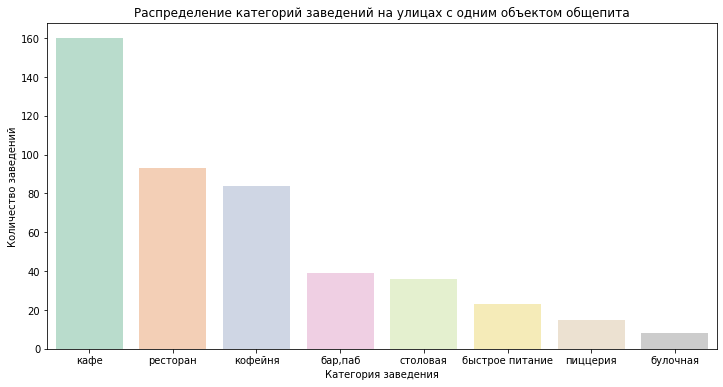

In [64]:
plt.figure(figsize=(12, 6))
sns.barplot(x='category', y='count', data=category_counts, palette='Pastel2')
plt.title('Распределение категорий заведений на улицах с одним объектом общепита')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=0)
plt.show()

**Вывод**  
Количество улиц с одним объектом общепита 458, чаще всего на этих улицах располагаются кафе и рестораны, реже всего пиццерии и булочные. .

#### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?


In [65]:
# посчитаем медиану столбца middle_avg_bill для каждого района
median_bill_by_district = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill_by_district = median_bill_by_district.sort_values(by='middle_avg_bill', ascending=False)
median_bill_by_district

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


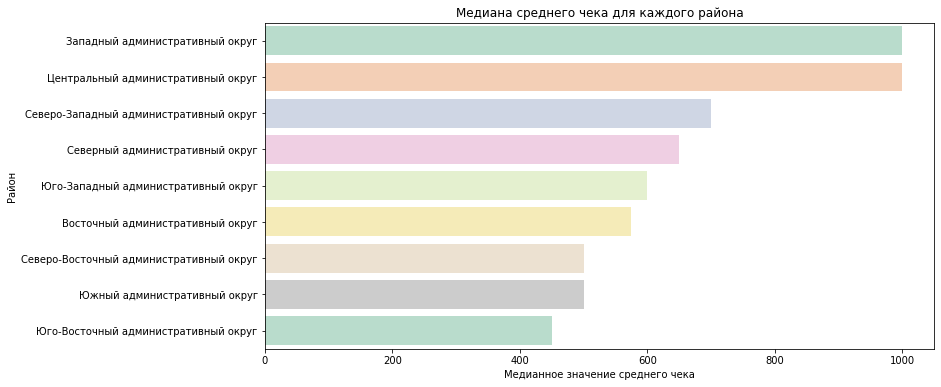

In [66]:
plt.figure(figsize=(12, 6))
sns.barplot(x='middle_avg_bill', y='district', data=median_bill_by_district, palette='Pastel2')
plt.title('Медиана среднего чека для каждого района')
plt.xlabel('Медианное значение среднего чека')
plt.ylabel('Район')
plt.show()

In [67]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
moscow_map_2 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10.5)

Choropleth(
    geo_data=moscow_area,
    data=median_bill_by_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.properties.name',
    fill_color='PuRd',  
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Хороплет с полученными значениями для каждого района',
).add_to(moscow_map_2)

# выводим карту
moscow_map_2

**Вывод**  
Центральный и западный округ имеют самый высокий средний чек по медиане - 1000 рублей.
Наименьшее медианное значение среднего чека в юго-восточном (450 рублей) и северо-восточном (500 рублей) округе.

#### Соберите наблюдения по вопросам выше в один общий вывод.

Общий вывод:  
ТОП-3 заведений по категориям:  
* Кафе (28,3%) = 2378;    
* Рестораны (24,3%) = 2043;    
* Кофейни (16,8%) = 1413.   
Наименьшее количество заведений:  
* Булочные (3,05%) = 256;   
* Столовые (3,75%) = 315;   
* Быстрое питание (7,17%) = 603.  

Наибольшее количество посадочных мест находится в ресторанах, барах и пабах, что логично, так как в этих местах часто собираются большие компании.   
Меньше всего посадочных мест в булочных, вероятно, потому что многие из них работают на вынос.  

В центральном районе сосредоточено наибольшее количество заведений, особенно ресторанов, что объясняется его премиальным статусом. В этом районе нет места дешевым столовым. Распределение заведений в остальных районах примерно одинаковое, за исключением северо-западного административного округа, где заведений меньше всего, и разница с соседними округами значительная (почти вдвое).  

Средний рейтинг заведений варьируется от 4.05 до 4.39. Люди более критично относятся к ресторанам быстрого питания и более благосклонны к барам и пабам. Самый высокий рейтинг заведений в центральном районе, а самый низкий — в юго-восточном районе.  

На проспекте Мира находится больше всего заведений, среди которых преобладают кафе.  
В ТОП-3 также вошли Профсоюзная улица и проспект Вернадского. На Профсоюзной улице также преобладают кафе, а на проспекте Вернадского чаще встречаются рестораны.  

Чаще всего одинаковые заведения встречаются в центральном районе. Средний чек (по медиане) в центральном и западном округах составляет 1000 рублей. Наименьший средний чек (по медиане) в южном, юго-восточном и северо-восточном округах.  

### Детализируем исследование: открытие кофейни
Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.  
Ответьте на следующие вопросы:  
Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?  
Есть ли круглосуточные кофейни?  
Какие у кофеен рейтинги? Как они распределяются по районам?  
На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?  
По желанию вы можете расширить список вопросов для исследования, добавив собственные.  
Постройте визуализации.  
Попробуйте дать рекомендацию для открытия нового заведения.  
Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

In [68]:
# найдем общее количество кофеен в Москве
coffee = df[df['category'] == 'кофейня']
print('Общее количество кофеен в Москве', len(coffee))

Общее количество кофеен в Москве 1413


In [69]:
district_counts = coffee['district'].value_counts().sort_values(ascending=False).reset_index()
district_counts.columns = ['district', 'count']

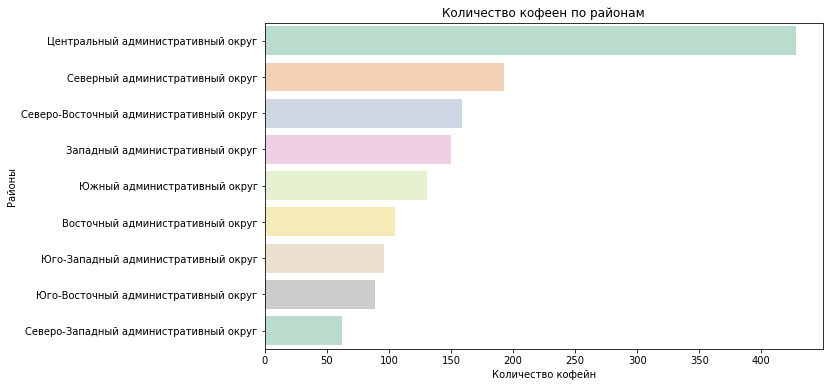

In [70]:
# посмотрим количество кофен по районам
plt.figure(figsize=(10, 6))
sns.barplot(x='count', y='district', data=district_counts, palette='Pastel2')
plt.title('Количество кофеен по районам')
plt.xlabel('Количество кофейн')
plt.ylabel('Районы')
plt.show()

**Вывод**  
Самое большое количество кофеен ожидаемо находится в центральном районе, меньше всего в северо-западном административном округе.

In [71]:
# найдем количество круглосуточных кофеен
print('Количество круглосуточных кофеен', len(coffee[coffee['is_24/7']==True]))

Количество круглосуточных кофеен 59


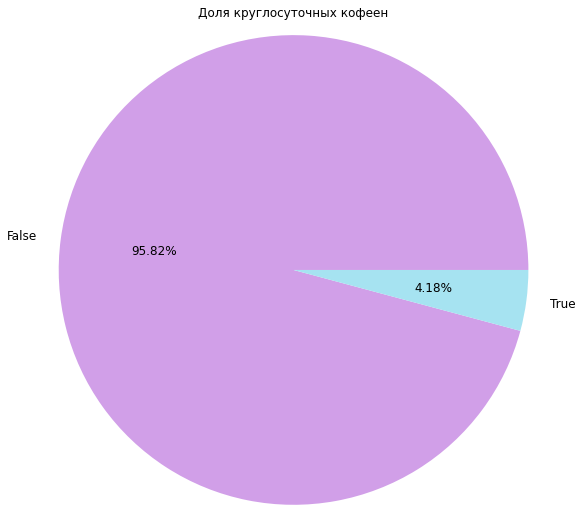

In [72]:
plt.figure(figsize=(7, 6))
coffee['is_24/7'].value_counts().plot.pie(radius=1.8, autopct='%1.2f%%', fontsize=12, colors=['#D19FE8','#a6e3f1'])
plt.title('Доля круглосуточных кофеен', pad=90)
plt.ylabel(None)
plt.show()

**Вывод**  
Всего круглосуточных кофеен в городе 59 штук, видимо, кофе не пользуется спросом у жителей в ночное время суток.

In [73]:
# найдем рейтинги кофеен
coffee_rating = coffee.groupby('district').agg({'rating': 'mean'}).round(2).sort_values(by='rating').reset_index()
coffee_rating = coffee_rating.sort_values(by='rating',ascending=False)

In [74]:
fig = px.bar(coffee_rating, x = 'district', y = 'rating', labels = {'rating': 'Средний рейтинг', 'district': 'Название района'},
                title = 'Средний рейтинг кофеен по районам', text='rating', color_discrete_sequence=['#dda6ff'])
fig.show()

**Вывод**  
Выше всего рейтинг в центральном и северо-западном районах, в этих районах находится наибольшее количество заведений, скорее всего они получают больше оценок, который формирует рейтинг. 

In [75]:
# найдем среднюю стоимость чашки капучино
coffee_avg = coffee.groupby('district').agg({'middle_coffee_cup': 'mean'}).reset_index()
coffee_avg['middle_coffee_cup'] = coffee_avg['middle_coffee_cup'].round()
coffee_avg = coffee_avg.sort_values(by='middle_coffee_cup', ascending=False)
print(coffee_avg)

                                  district  middle_coffee_cup
1          Западный административный округ              190.0
5       Центральный административный округ              188.0
7      Юго-Западный административный округ              184.0
0         Восточный административный округ              174.0
2          Северный административный округ              166.0
4   Северо-Западный административный округ              166.0
3  Северо-Восточный административный округ              165.0
8             Южный административный округ              158.0
6     Юго-Восточный административный округ              151.0


**Вывод**  
Средняя стоимость чашки капучино в центральном районе 188 рублей, самая высокая стоимость в западном районе 190 рублей.

In [76]:
# отобразим на карте
moscow_map_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10.5)
Choropleth(
    geo_data=moscow_area,
    data=coffee_avg,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuRd',  
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Средняя цена за чашку капучино',
).add_to(moscow_map_3)

moscow_map_3

**Вывод**  
На основе данных, полученных в ходе исследования, рекомендуется рассмотреть возможность открытия кофейни в Центральном административном округе или другом популярном районе с высоким потоком туристов и местных жителей.  
Также стоит обратить внимание на Северный, Северо-Западный и Юго-Западный административные округа, где наблюдается высокий средний рейтинг заведений при относительно низком их количестве. При этом, уникальная концепция заведения и услуг может стать ключевым фактором успеха в менее представленных районах, таких как Северо-Западный административный округ, что позволит привлечь клиентов и создать конкурентные преимущества. Однако, даже в популярных районах, важно предложить что-то новое и запоминающееся, чтобы выделиться на фоне высокой конкуренции.  

Если кофейня будет расположена вне популярных районов, стоит включить в концепцию формат напитков на вынос. Это может быть особенно прибыльно, если рядом находятся офисы, производственные комплексы или другие места с ограниченным доступом к кофейным заведениям, также это требует меньше затрат. В популярных районах кофе на вынос также будет востребован, но не станет основным направлением.  

Можно рассмотреть возможность открытия кофейни, работающей в ночное время, особенно в центре города, где спрос на ночные заведения может быть высоким.  

При определении цен на кофе важно учитывать средний уровень цен в соответствующем районе, а также предпочтения и платежеспособность целевой аудитории. Например, в Центральном округе цены могут быть выше, чем в спальных районах, что будет оправдано и не приведет к убыткам. Формируя цены, стоит также учитывать конкурентное преимущество в создании уникальной атмосферы и опыта для посетителей, чтобы выделиться среди других кофеен.  

Презентация: <https://disk.yandex.ru/i/VvReEoZ4m2MXWQ>